### Visualisations
- Clustering points
- Binned plots
- Good visualizations vs Bad visualizastions
- *You can probably forget what you've learned in EoDP...*


1. Your visualisation needs to tell a story
2. It should be intepretable without a wall of text
3. The scale and axis need to make sense (and you can assume the reader knows the difference between a normal scale vs log scale)
4. The choice of visualisation needs to make sense:
    - Line plot vs Bar chart with non-numerical categories
    - Map plot with points vs clusters for each location
    - Scatterplot vs Histogram plot to see distribution
    - etc
5. Choice of colours need to be easy to view and compliment

In [1]:
import pandas as pd
import numpy as np

In [2]:
# read in the data
df = pd.read_csv("../data/Lab1/sample.csv")

df.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,store_and_fwd_flag,dropoff_longitude,...,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PickupCell,DropoffCell
0,2,1/12/15 0:00,1/12/15 0:05,5,0.96,-73.979942,40.765381,1,N,-73.966309,...,1,5.5,0.5,0.5,1.00,0.0,0.3,7.80,25:64,27:63
1,2,1/12/15 0:00,1/12/15 0:00,2,2.69,-73.972336,40.762379,1,N,-73.993629,...,1,21.5,0.0,0.5,3.34,0.0,0.3,25.64,26:64,25:69
2,2,1/12/15 0:00,1/12/15 0:00,1,2.62,-73.968849,40.764530,1,N,-73.974548,...,1,17.0,0.0,0.5,3.56,0.0,0.3,21.36,26:63,22:59
3,1,1/12/15 0:00,1/12/15 0:05,1,1.20,-73.993935,40.741684,1,N,-73.997665,...,1,6.5,0.5,0.5,0.20,0.0,0.3,8.00,25:70,24:69
4,1,1/12/15 0:00,1/12/15 0:09,2,3.00,-73.988922,40.726990,1,N,-73.975594,...,2,11.0,0.5,0.5,0.00,0.0,0.3,12.30,28:71,33:75


### Clustering

In [3]:
import folium
from folium.plugins import FastMarkerCluster

# lat, long
COORDS = ['pickup_latitude', 'pickup_longitude']

# create an interactive geospatial graph
nycM = folium.Map(location=[40.66, -73.94], tiles="Stamen Terrain", zoom_start=10)

# use a built-in clustering algorithm to apply markers for hotspots
FastMarkerCluster(data=df[COORDS].values).add_to(nycM)

# visualize the plot 
nycM.save('../plots/foliumFastCluster.html')
nycM

- Compared to last weeks' visualisation, it is much easier to see the distribution
- Zoom in for specific zones/areas
- We now have numerical values to put to areas (compared to a plethora of points)

### Heatmaps

Heatmap of pickup locations

In [4]:
from folium.plugins import HeatMap

nycM2 = folium.Map(location=[40.66, -73.94], tiles="Stamen Terrain", zoom_start=10)
nycM2.add_child(HeatMap(df[COORDS].values, radius=10))

nycM2.save('../plots/foliumPickupHeatmap.html')
nycM2

Heatmap of dropoff locations

In [5]:
nycM3 = folium.Map(location=[40.66, -73.94], tiles="Stamen Terrain", zoom_start=10)
nycM3.add_child(HeatMap(df[['dropoff_latitude', 'dropoff_longitude']].values, radius=10))

nycM3.save('../plots/foliumDropoffHeatmap.html')
nycM3

### Hex Binned Plots

In [6]:
from bokeh.plotting import figure, show
from bokeh.io import save

# tile providers are the underlying map 
from bokeh.tile_providers import get_provider, Vendors
TILE = get_provider("STAMEN_TERRAIN_RETINA")

# to display bokeh plots inside jupyter, we need to use output_notebook
from bokeh.io import reset_output, output_notebook
reset_output()
output_notebook()
# note below that it says "BokehJS 1.4.0 successfully loaded."

Loading BokehJS ...

In [7]:
df.dropna(inplace=True)
xRange = [df['pickup_longitude'].min(), df['pickup_longitude'].max()]
yRange = [df['pickup_latitude'].min(), df['pickup_latitude'].max()]

def lat2mercer(coords):
    k = 6378137
    converted = list()
    for lat in coords:
        converted.append(np.log(np.tan((90 + lat) * np.pi/360.0)) * k)
    return converted

def lon2mercer(coords):
    k = 6378137
    converted = list()
    for lon in coords:
        converted.append(lon * (k * np.pi/180.0))
    return converted

# convert to mercer
df['pickupX'] = df['pickup_longitude'].apply(lambda x: lon2mercer([x])[0])
df['pickupY'] = df['pickup_latitude'].apply(lambda x: lat2mercer([x])[0])

In [12]:
# create bokeh figure, where x_range and y_range are in mercer
p = figure(x_range=lon2mercer(xRange), y_range=lat2mercer(yRange),
           x_axis_type="mercator", y_axis_type="mercator")
# add map tile
p.add_tile(TILE)
# change title
p.title.text = "Hex-Binned Pickups in NYC"

# add hexbin (size param is the bin size - more about it next week)
p.hexbin(x=df['pickupX'], y=df['pickupY'], size=250)

show(p)
save(p, '../plots/bokehPickupHexBinned.html')

'C:\\Users\\Akira Wang\\Documents\\GitHub\\MAST30034Repo\\plots\\bokehPickupHexBinned.html'

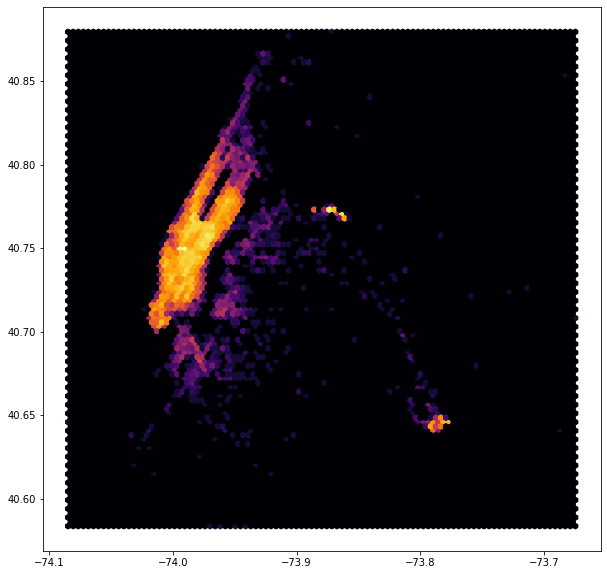

In [14]:
import matplotlib.pyplot as plt

test = df.dropna()
plt.figure(figsize=(10,10))

plt.hexbin(x = test[COORDS[1]], y= test[COORDS[0]],
           gridsize=100, bins='log', cmap='inferno')

plt.show()